<a href="https://colab.research.google.com/github/BenFarz/Demo/blob/main/Dopo_August.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import necessary libraries
!pip install ultralytics
from google.colab import drive
import os
from skimage import io
import numpy as np
from matplotlib import pyplot as plt
from ultralytics import YOLO

from PIL import Image
import yaml
import tensorflow as tf


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# Define project directory for results
project = "/content/drive/MyDrive/AI3/results"
# Define subdirectory name for this specific training
name = "200_epochs-shab"  # This will create a new directory like '200_epochs-', '200_epochs-2', etc.



In [ ]:
# Check and list the saved models in 'results' directory
model_weights_path = f"{project}/{name}/weights"
!ls {model_weights_path}


best.pt  last.pt


In [ ]:
# Load the trained model
n_model = YOLO(f"{model_weights_path}/best.pt")

In [ ]:
# Test the trained model with a sample image
n_image = '/content/drive/MyDrive/AI3/tests/327.jpg'
n_results = n_model.predict(n_image, conf=0.2)  # Adjust conf threshold


image 1/1 /content/drive/MyDrive/AI3/tests/327.jpg: 640x480 3 potholes, 87.9ms
Speed: 12.4ms preprocess, 87.9ms inference, 816.7ms postprocess per image at shape (1, 3, 640, 480)


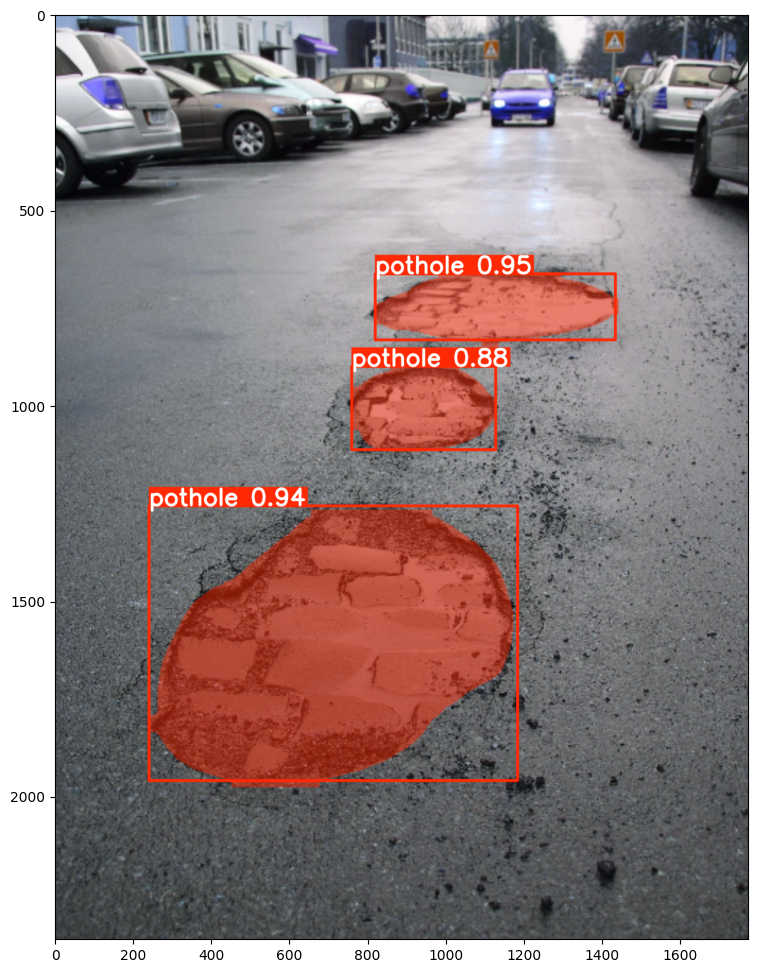

In [ ]:
# Plot the results
n_results_array = n_results[0].plot()
plt.figure(figsize=(12, 12))
plt.imshow(n_results_array)
plt.show()


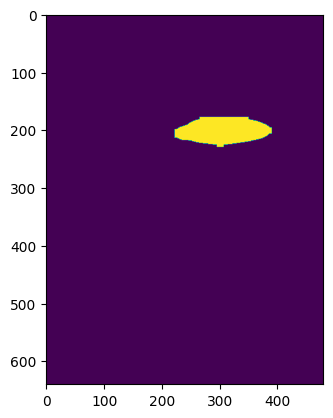

In [ ]:
# Extract and display masks
n_results = n_results[0]
masks_array = n_results.masks.data.cpu().numpy()
plt.imshow(masks_array[0])
plt.show()


In [ ]:
# Display class names
class_names = n_results.names.values()
print(class_names)

dict_values(['pothole'])


In [ ]:
# Define path to the results directory
results_dir = os.path.join(project, name)

In [ ]:
# Verify the contents of the results directory
print("Contents of the results directory:")
!ls {results_dir}

Contents of the results directory:
args.yaml					   MaskF1_curve.png	train_batch3801.jpg
BoxF1_curve.png					   MaskP_curve.png	train_batch3802.jpg
BoxP_curve.png					   MaskPR_curve.png	val_batch0_labels.jpg
BoxPR_curve.png					   MaskR_curve.png	val_batch0_pred.jpg
BoxR_curve.png					   results.csv		val_batch1_labels.jpg
confusion_matrix_normalized.png			   results.png		val_batch1_pred.jpg
confusion_matrix.png				   train_batch0.jpg	val_batch2_labels.jpg
events.out.tfevents.1717881724.4e471229c35e.941.0  train_batch1.jpg	val_batch2_pred.jpg
labels_correlogram.jpg				   train_batch2.jpg	weights
labels.jpg					   train_batch3800.jpg


In [ ]:
# Start TensorBoard for visualizing training logs from the results directory
%load_ext tensorboard
%tensorboard --logdir {results_dir}

# Note: Make sure the results_dir is the correct path where the event files are stored.


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>